In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [4]:
!pip install ultralytics

In [5]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.235 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6567.5/8062.4 GB disk)


In [7]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="dzZEOQuovIy0ctNJW33A")
project = rf.workspace("research-on-plant-disease").project("plant-disease-detection-4htzn-ciqla")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...


In [ ]:
!pip insall "numpy<2.0" --force-reinstall --no-cache-dir
!pip install "numpy<2.0" "matplotlib>=3.7,<3.9" --force-reinstall --no-cache-dir
import os, sys
os._exit(0)

ERROR: unknown command "insall" - maybe you meant "install"
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.2/113.2 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 237.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 274.7 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 355.2/355.2 kB 376.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 315.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 385.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 315.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 196.2 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.9/113.9 kB 348.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 327.6 MB/s eta 0:00:00
  Attempting uninstall: six
    Foun

In [7]:
!yolo train task=detect \
  data=/kaggle/working/plant-disease-detection-1/data.yaml \
  model=yolo11x.pt \
  epochs=5 \
  imgsz=640 \
  batch=8 \
  mosaic=0.0 \
  close_mosaic=0 \
  device=0 \
  project=/kaggle/working/ablation_runs \
  name=mosaic_off \
  workers=2


Ultralytics 8.3.235 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=0, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/plant-disease-detection-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11x.pt, momentum=0.937, mosaic=0.0, multi_scale=False, name=mosaic_off7, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=

In [9]:
import pandas as pd
df = pd.read_csv("/kaggle/working/ablation_runs/mosaic_off7/results.csv")
df


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,969.80,0.94554,2.16502,1.53136,0.50583,0.51152,0.46652,0.34490,0.98433,2.33543,1.51915,0.000123,0.000123,0.000123
1,2,1940.53,0.93419,1.55994,1.50764,0.64557,0.55737,0.62588,0.50211,0.87889,2.07689,1.40371,0.000198,0.000198,0.000198
2,3,2904.57,0.82761,1.25506,1.40652,0.76559,0.61815,0.72552,0.58213,0.80200,1.96831,1.29085,0.000223,0.000223,0.000223
3,4,3866.54,0.73929,0.96659,1.32189,0.80844,0.73704,0.83743,0.71532,0.62389,1.19277,1.17989,0.000150,0.000150,0.000150
4,5,4828.91,0.63528,0.72706,1.23455,0.83580,0.81567,0.89580,0.78939,0.56028,1.05026,1.11355,0.000077,0.000077,0.000077


In [10]:
df.tail(1)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
4,5,4828.91,0.63528,0.72706,1.23455,0.8358,0.81567,0.8958,0.78939,0.56028,1.05026,1.11355,0.000077,0.000077,0.000077


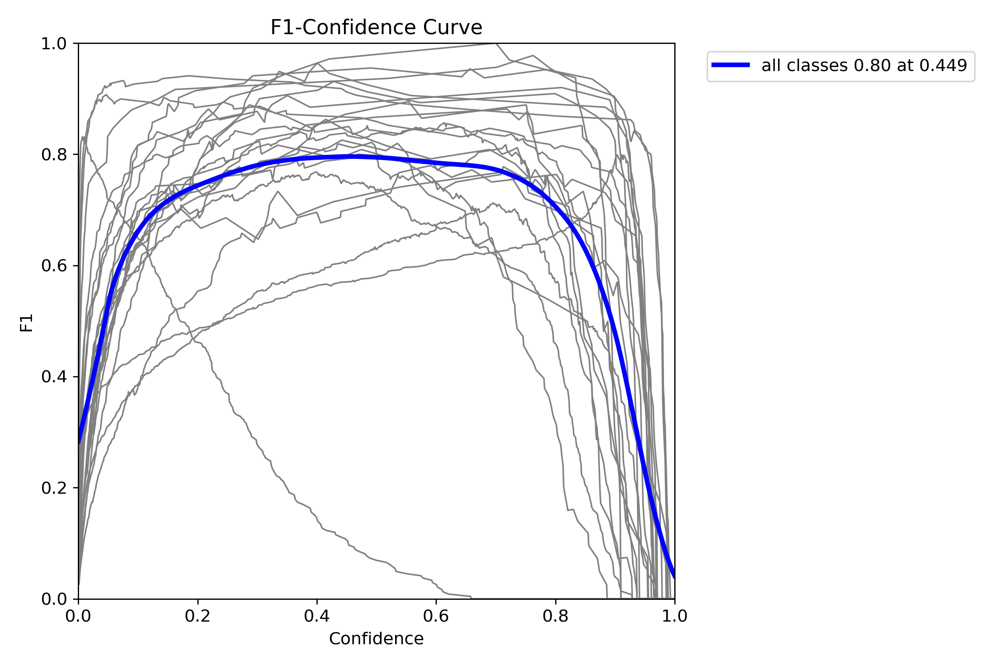

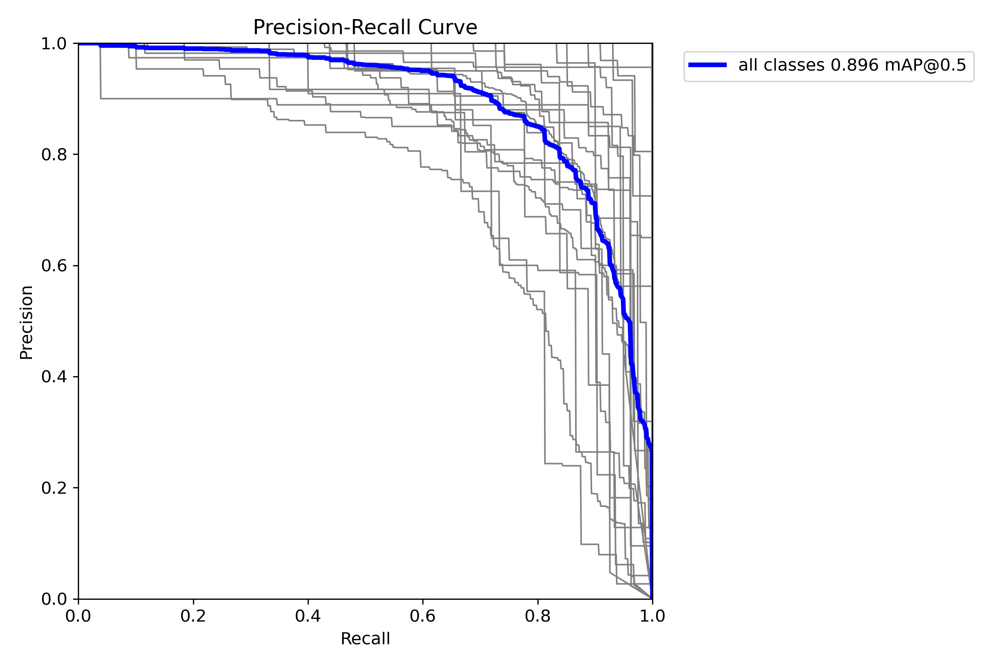

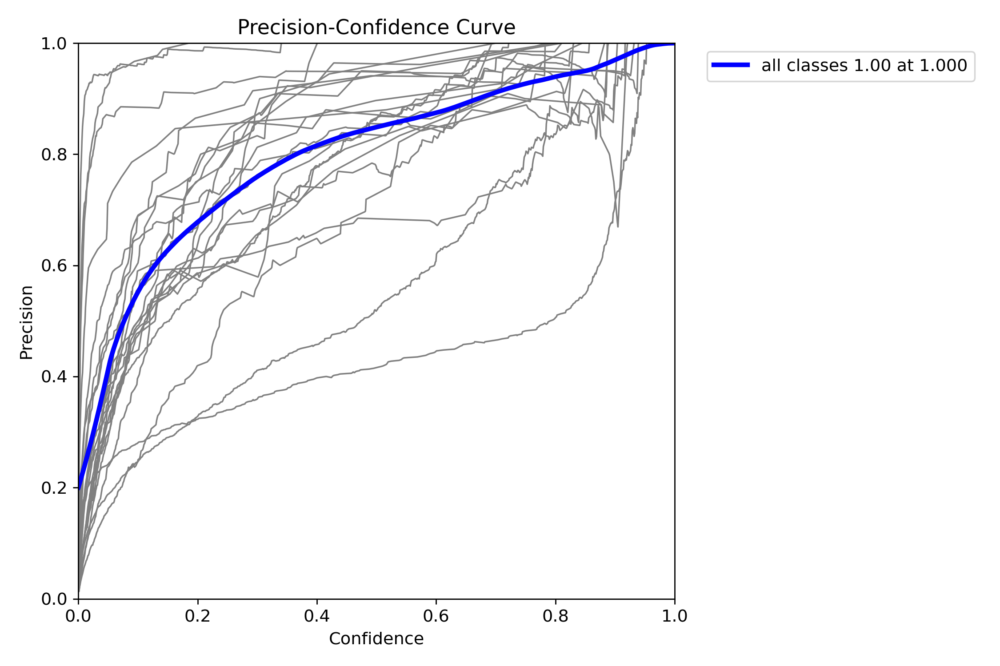

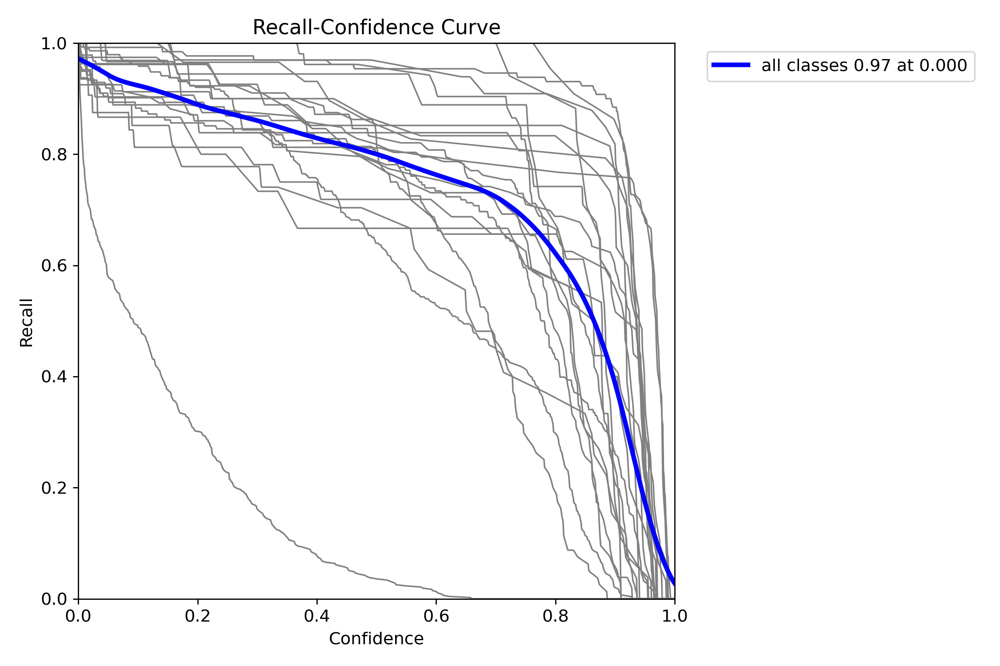

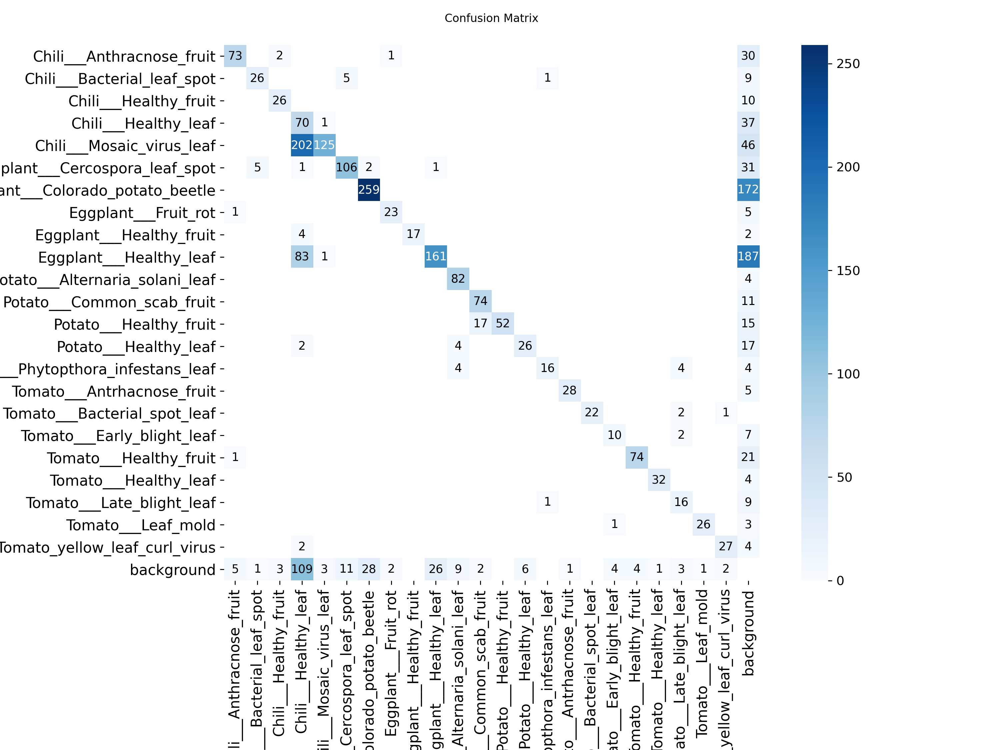

...

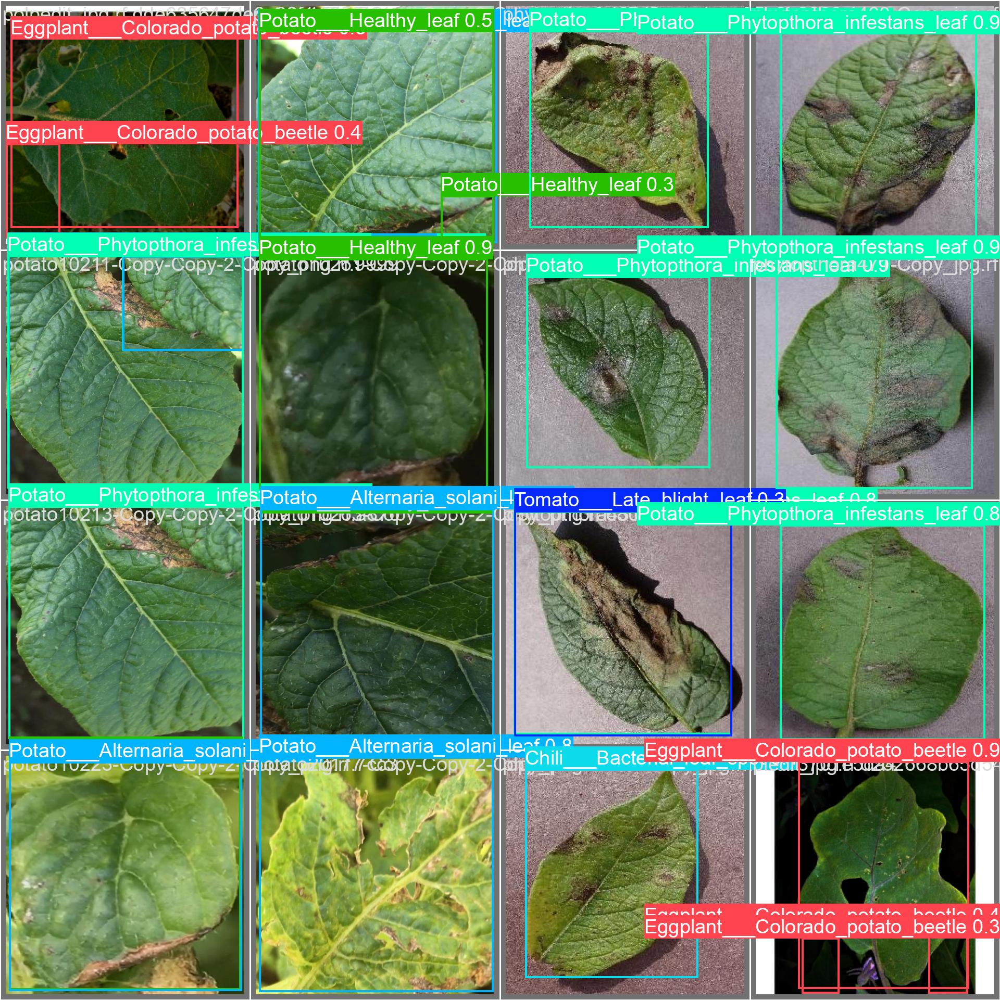

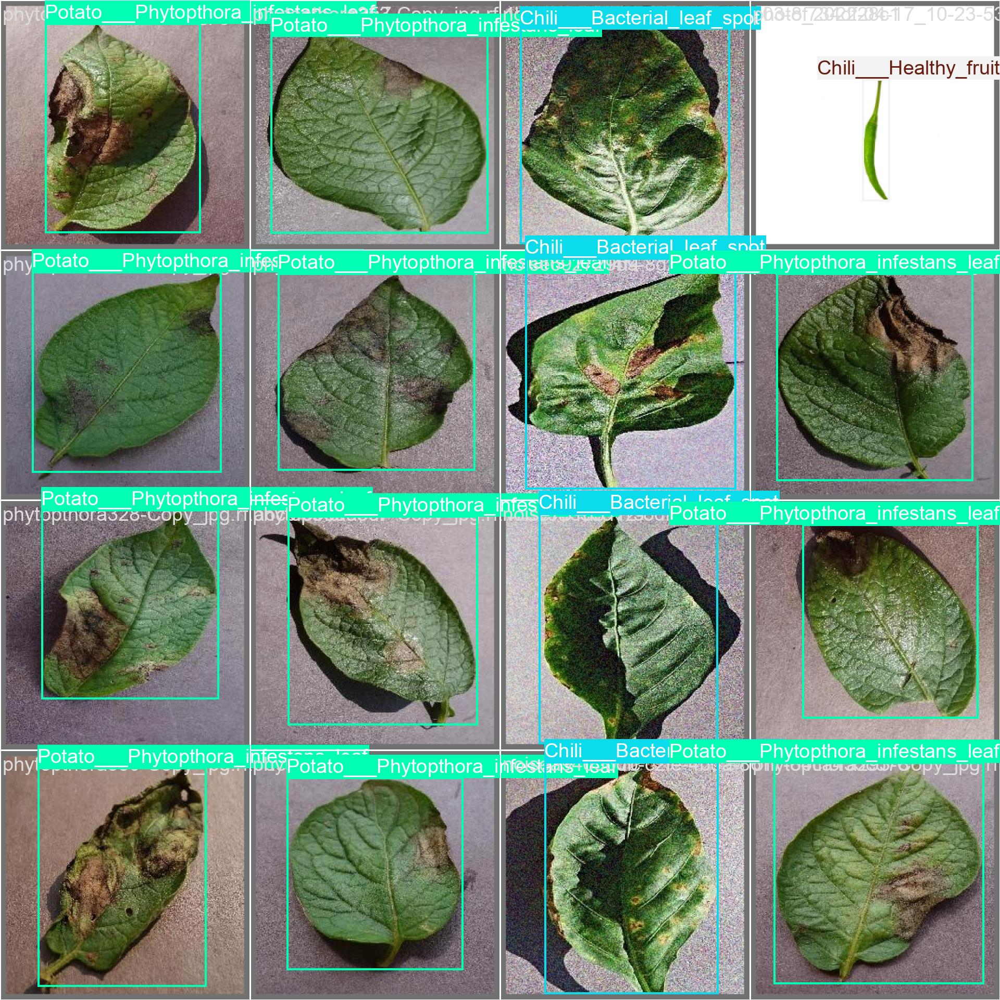

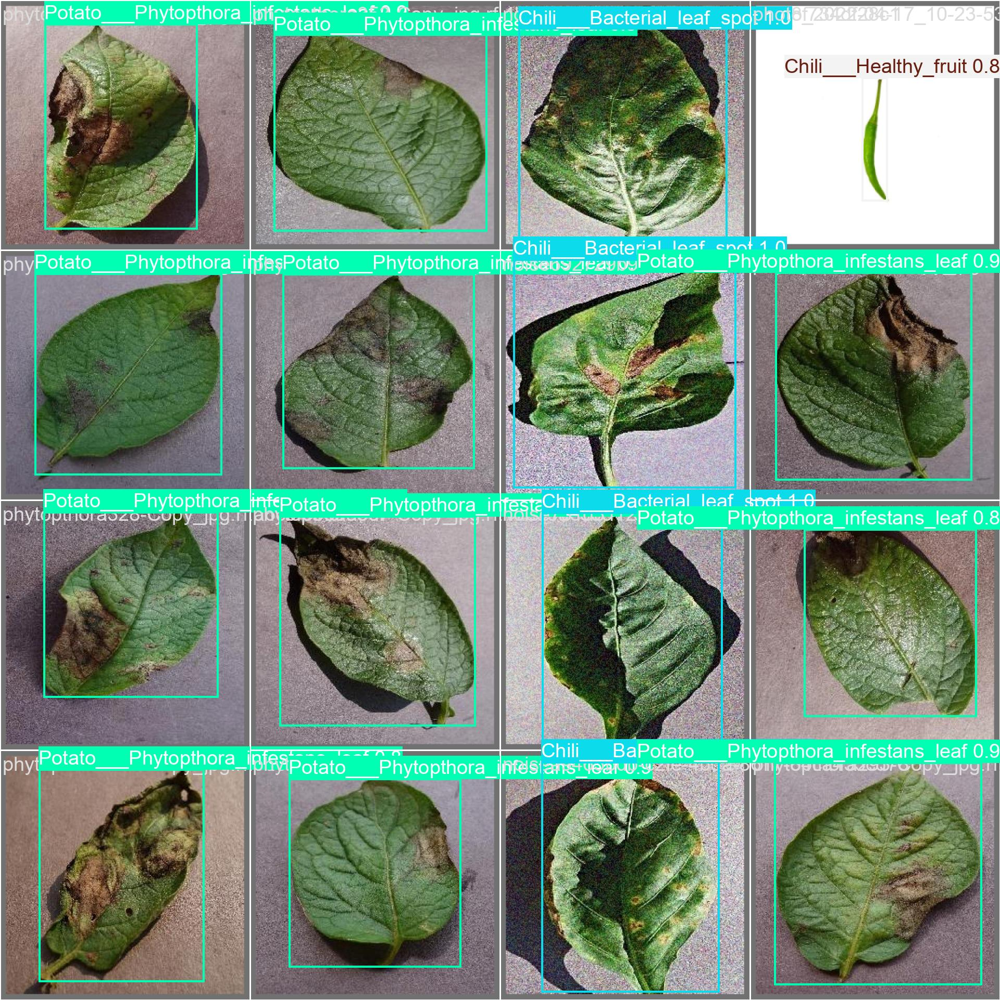

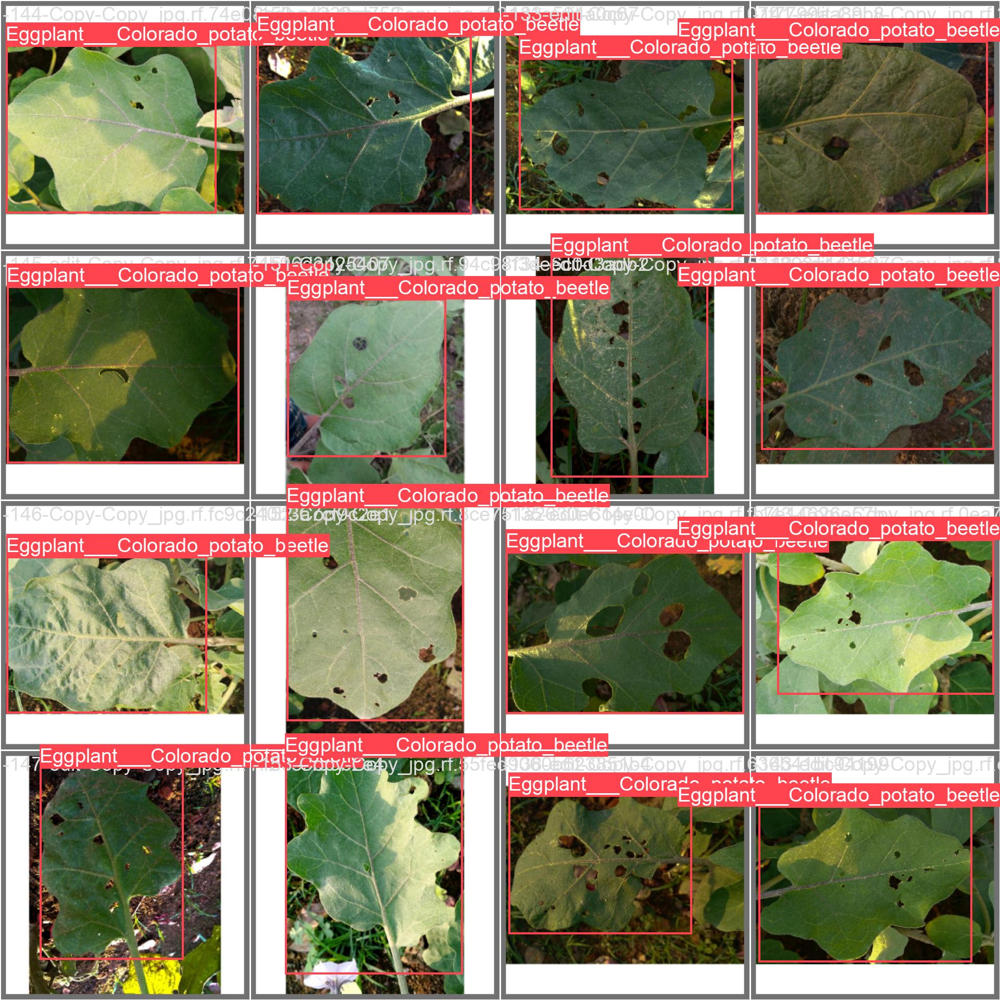

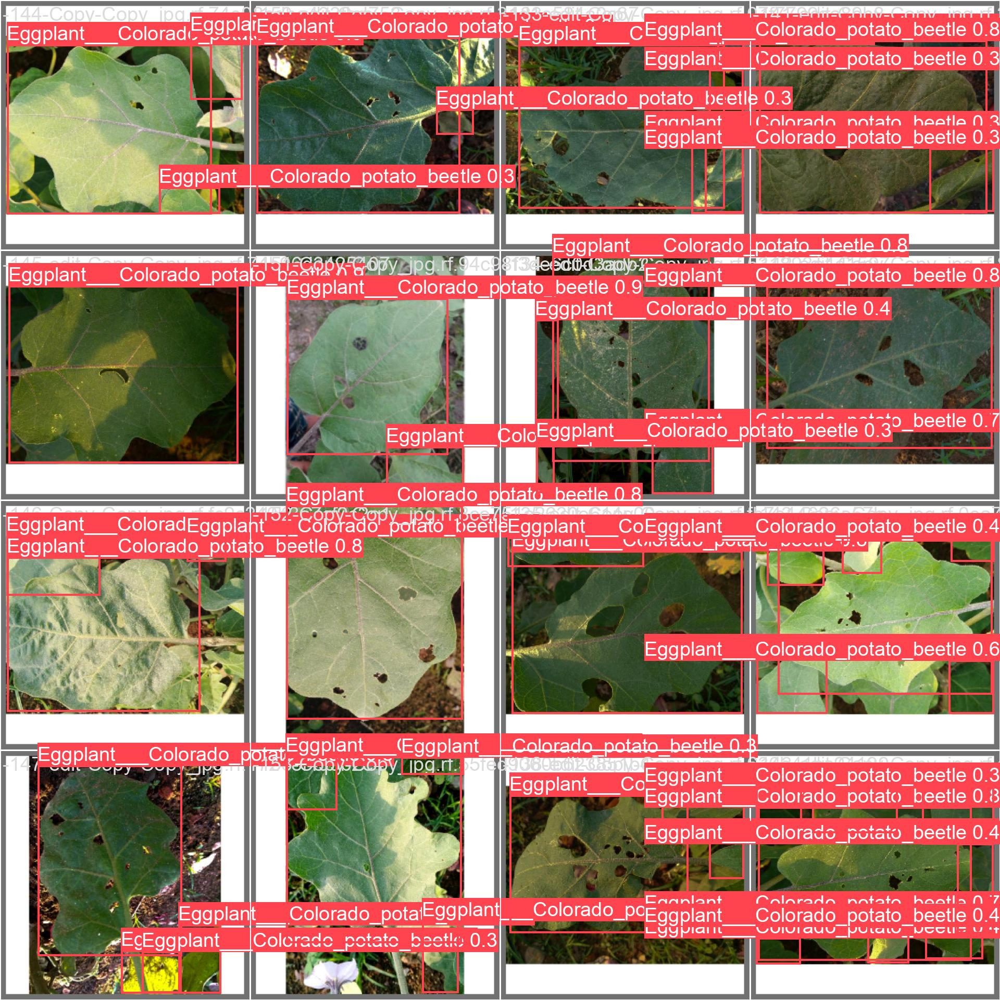

In [12]:
import os
from IPython.display import Image, display

folder_path = "/kaggle/working/ablation_runs/mosaic_off7"

# Loop through all files in the folder
for file in sorted(os.listdir(folder_path)):
    if file.lower().endswith((".png", ".jpg", ".jpeg")):  # image formats
        display(Image(filename=os.path.join(folder_path, file), width=800))

In [13]:
! pip install pyyaml
import yaml

path = "/kaggle/working/ablation_runs/mosaic_off7/args.yaml"

with open(path, 'r') as f:
    args_data = yaml.safe_load(f)

args_data
import pandas as pd

df = pd.DataFrame.from_dict(args_data, orient='index', columns=['Value'])
df.head(20)

,Value
task,detect
mode,train
model,yolo11x.pt
data,/kaggle/working/plant-disease-detection-1/data...
epochs,5
time,None
patience,100
batch,8
imgsz,640
save,True


In [14]:
pd.set_option('display.max_rows', None)
print(df)

                                                             Value
task                                                        detect
mode                                                         train
model                                                   yolo11x.pt
data             /kaggle/working/plant-disease-detection-1/data...
epochs                                                           5
time                                                          None
patience                                                       100
batch                                                            8
imgsz                                                          640
save                                                          True
save_period                                                     -1
cache                                                        False
device                                                           0
workers                                                       